# Disco Diffusion

This is an simple way of creating compelling [Disco Diffusion](http://discodiffusion.com) artworks for generative artists.


## References:

- [Disco Diffusion Cheatsheet](https://dreamingcomputers.com/disco-diffusion/disco-diffusion-cheatsheet/)
- [Zippy's Disco Diffusion Cheatsheet v0.3](https://docs.google.com/document/d/1l8s7uS2dGqjztYSjPpzlmXLjl5PM3IGkRWI3IiCuK7g/mobilebasic)
- [Disco Diffusion Illustrated Settings](https://mpaugam.notion.site/Disco-Diffusion-Illustrated-Settings-cd4badf06e08440c99d8a93d4cd39f51)
- [EZ Charts - Diffusion Parameter Studies](https://docs.google.com/document/d/1ORymHm0Te18qKiHnhcdgGp-WSt8ZkLZvow3raiu2DVU/edit#)
- [Coar’s Disco Diffusion Guide](https://coar.notion.site/coar/Coar-s-Disco-Diffusion-Guide-3d86d652c15d4ca986325e808bde06aa#8a3c6e9e4b6847afa56106eacb6f1f79)
- [A Traveler’s Guide to the Latent Space](https://sweet-hall-e72.notion.site/A-Traveler-s-Guide-to-the-Latent-Space-85efba7e5e6a40e5bd3cae980f30235f#e122e748b86e4fc0ad6a7a50e46d6e10)


```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.
```

```{toggle}
%%capture
!pip install ekorpkit[disco]
exit()
```

In [2]:
# %pip install --upgrade --pre ekorpkit[disco]

In [1]:
from ekorpkit import eKonf

eKonf.setLogger("WARNING")
eKonf.set_cuda(device=4)
print("version:", eKonf.__version__)

is_notebook = eKonf.is_notebook()
is_colab = eKonf.is_colab()
print("is notebook?", is_notebook)
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive(
        workspace="MyDrive/colab_workspace", project="disco-imagen"
    )

INFO:ekorpkit.base:Setting cuda device to ['A100-SXM4-40GB (id:4)']
INFO:ekorpkit.base:Google Colab not detected.


version: 0.1.38+12.g9e61884.dirty
is notebook? True
is colab? False


### self-upgrade of ekorpkit

In [2]:
# eKonf.upgrade(prelease=True, quiet=False, verbose=True, force_reinstall=False)

## Create a disco instance

In [3]:
cfg = eKonf.compose("model/disco")
disco = eKonf.instantiate(cfg)

INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env
INFO:ekorpkit.base:setting environment variable CACHED_PATH_CACHE_ROOT to /workspace/.cache/cached_path
INFO:ekorpkit.base:setting environment variable KMP_DUPLICATE_LIB_OK to TRUE


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /opt/conda/lib/python3.8/site-packages/lpips/weights/v0.1/vgg.pth


### Batch generation

In [4]:
batch_name = "newworld"
text_prompts = "Brave and beautiful new world in Jeju, artstation matte painting."
set_seed = 123
batch_args = {
    "clip_guidance_scale": [1000, 5000, 10000, 50000],
    "steps": [50, 100, 250, 500],
    "tv_scale": [0, 1000, 10000, 20000],
    "eta": [0.0, 0.4, 0.8, 1.0],
    "clamp_max": [0.01, 0.05, 0.5],
    "cut_overview": ["[12]*1000", "[12]*400+[4]*600", "[1]*1000"],
    "cut_innercut": ["[12]*1000", "[4]*400+[12]*600", "[1]*1000"],
    "cut_ic_pow": [1, 10, 100],
    "cutn_batches": [1, 2, 4],
}
batch_args = {
    "clip_guidance_scale": [1000, 5000],
    "steps": [50, 100],
    "tv_scale": [0, 1000],
    "eta": [0.0, 1.0],
    "clamp_max": [0.01, 0.5],
    "cut_overview": ["[12]*1000", "[1]*1000"],
    "cut_innercut": ["[12]*1000", "[1]*1000"],
    "cut_ic_pow": [1, 100],
    "cutn_batches": [1, 4],
}
batch_pairs = [
    ("clip_guidance_scale", "steps", "tv_scale"),
    ("eta", "steps"),
    ("clamp_max", "steps"),
    ("eta", "clamp_max"),
    ("cut_overview", "cut_innercut"),
    ("cut_ic_pow", "cutn_batches"),
]
batch_results = disco.batch_imagine(
    text_prompts=text_prompts, 
    batch_name=batch_name, 
    batch_args=batch_args, 
    batch_pairs=batch_pairs,
    set_seed=set_seed
)
print(batch_results)

newworld_clip_guidance_scale_steps_tv_scale(71) samples:   0%|          | 0/1 [00:00<?, ?it/s]

Output()

  0%|          | 0/90 [00:00<?, ?it/s]

## collage batch results

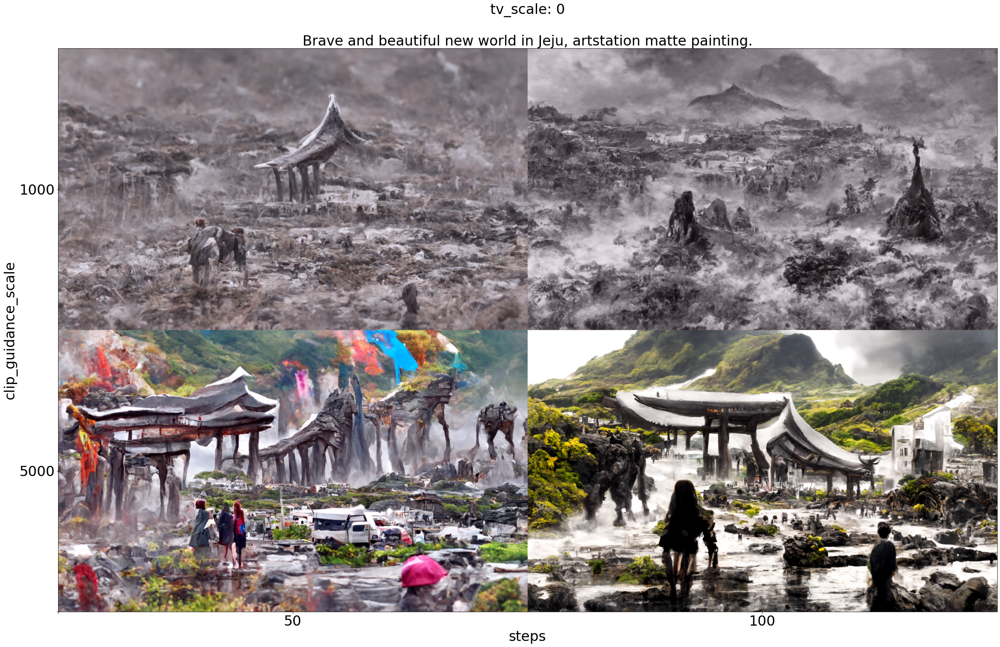

Saved collage to /workspace/projects/ekorpkit-book/disco-imagen/outputs/disco-diffusion/batch_configs/newworld_clip_guidance_scale_steps_tv_scale_batch_configs_tv_scale(0).png


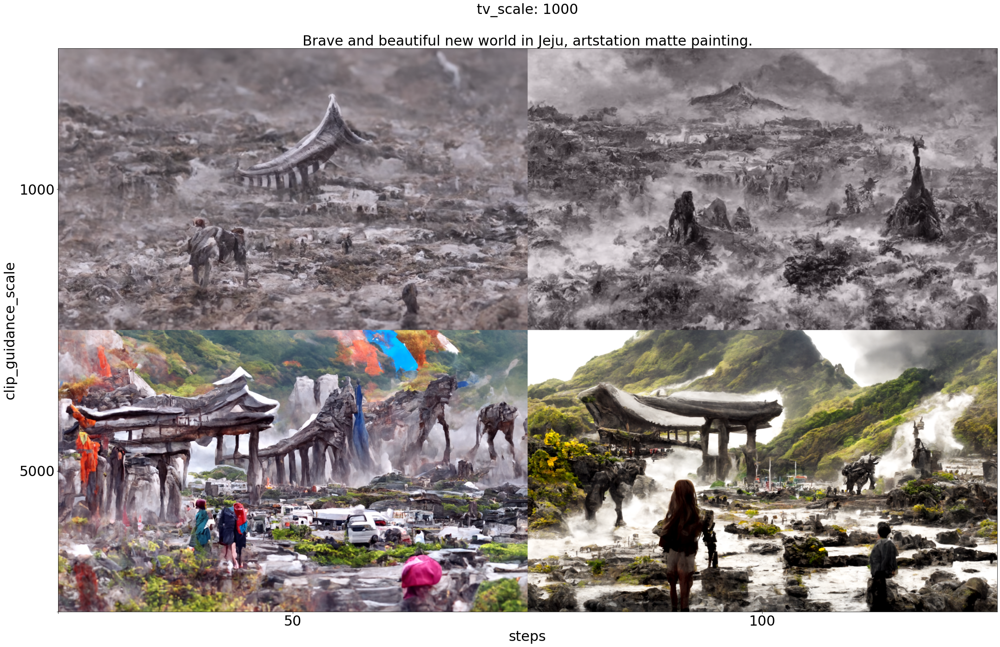

Saved collage to /workspace/projects/ekorpkit-book/disco-imagen/outputs/disco-diffusion/batch_configs/newworld_clip_guidance_scale_steps_tv_scale_batch_configs_tv_scale(1000).png


In [4]:
# batch_config_path = batch_results[0]
batch_config_path = "/workspace/projects/ekorpkit-book/disco-imagen/outputs/disco-diffusion/batch_configs/newworld_clip_guidance_scale_steps_tv_scale_batch_configs.yaml"

disco.batch_collage(
    batch_config_path=batch_config_path,
    prompt_fontsize=30,
    fontsize=30,
)
